In [1]:
import sys
import seaborn as sns
import os
import glob
from matplotlib import pyplot as plt
import numpy as np
import plot as pltfn
from sklearn.cluster import KMeans
sns.reset_orig()
%load_ext autoreload
%autoreload

# Define paths
#---------------------------------------------------------------------------
Fdrop = '/Users/dominicburrows/Dropbox/PhD/analysis/'
Fmac = '/Users/dominicburrows/Documents/'
F10t = '/Volumes/Dominic 10tb/'
Ffig = '/Users/dominicburrows/Dropbox/PhD/figures/'
Ftm = '/Volumes/Dominic Time Machine/'

/Users/dominicburrows/anaconda3/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The examples.directory rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2. In the future, examples will be found relative to the 'datapath' directory.
  self[key] = other[key]
/Users/dominicburrows/anaconda3/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
/Users/dominicburrows/anaconda3/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
  self[key] = other[key]
/Users/dominicburrows/anaconda3/lib/python3.7/_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
/Users/dominicburrows/anaconda3/lib/python3.7/_collectio

In [3]:
# Create lists of trace data
#---------------------------------------------------------------------------
experiment = 'PTZ-WILDTYPE'
os.chdir(Fdrop + 'Project/' + experiment)
realtrace = sorted(glob.glob('*BLN*realtrace.npy'))
base = sorted(glob.glob('*BLN*_baseline.npy'))
bind = sorted(glob.glob('*BLN*_binarised.npy'))
cal = sorted(glob.glob('*BLN*_modelcal.npy'))
blnraw = sorted(glob.glob('*BLN*_cutrealtrace.npy'))
p5raw = sorted(glob.glob('*PTZ05*_cutrealtrace.npy'))
p20raw = sorted(glob.glob('*PTZ20*_cutrealtrace.npy'))
coordlist = sorted(glob.glob('*PTZ20*realcoord.npy'))
coordlist

['PTZ-WILDTYPE-02_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-03_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-04_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-05_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-06_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-07_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-08_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-09_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-10_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-11_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy',
 'PTZ-WILDTYPE-12_2photon_sess-01-6dpf_PTZ20_run-01_realcoord.npy']

* sliding window: pre-seizure, seizure and post-seizure
* identify cell populations involved in both
* are there reliable cell populatons across seizures and fish?
* try removing first factor - is just average

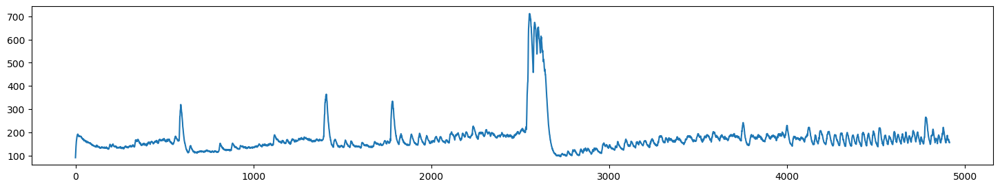

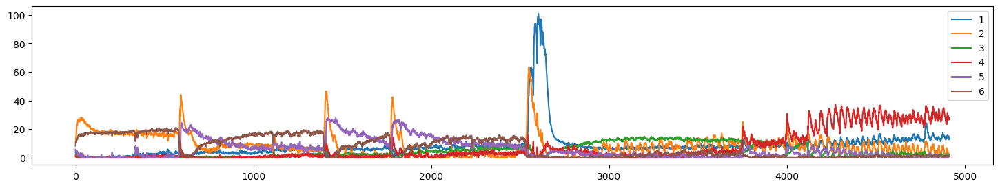

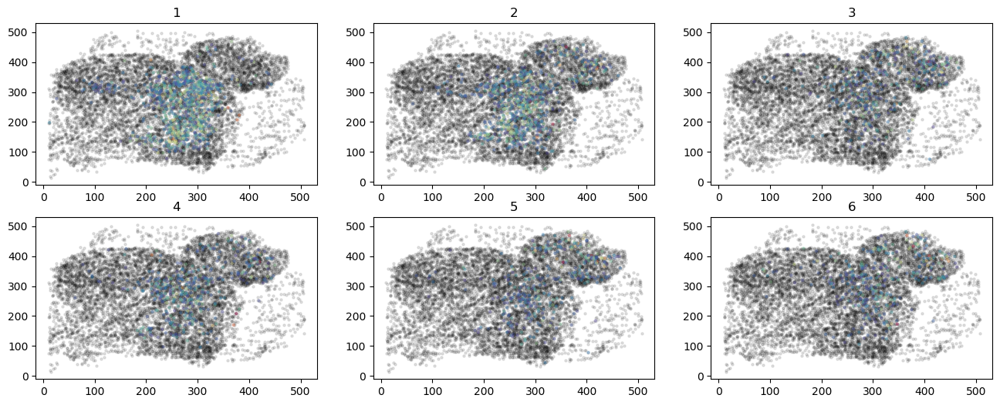

In [59]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 0, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

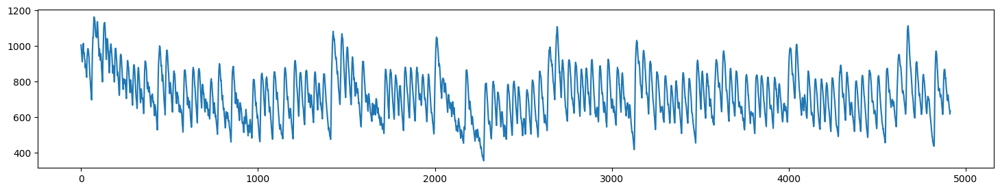

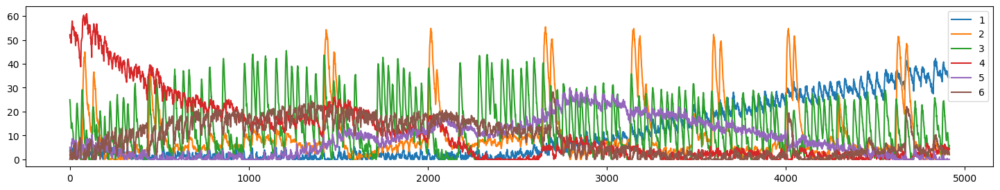

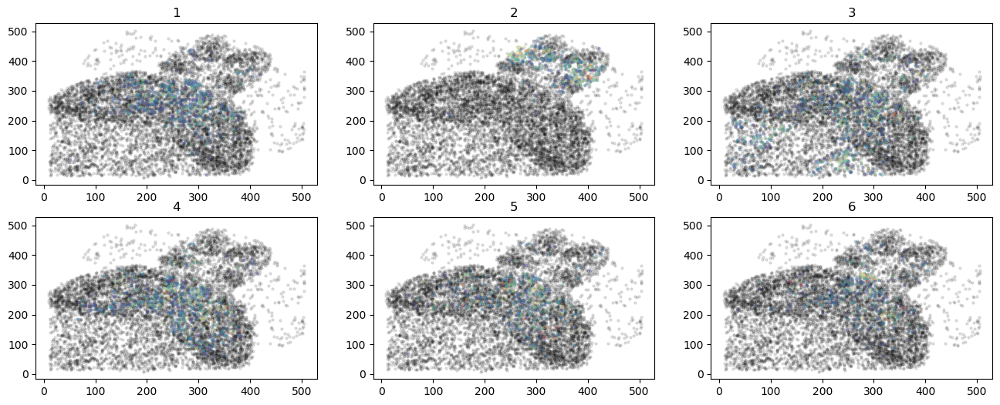

In [60]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 1, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

In [2]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 2, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

NameError: name 'coordlist' is not defined

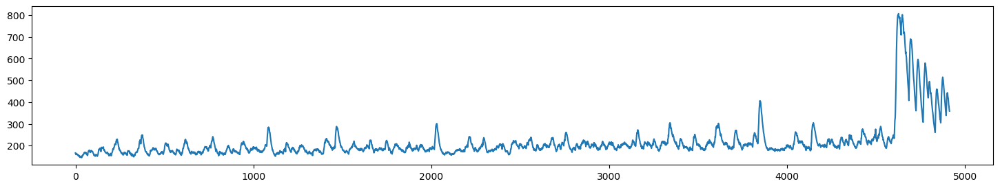

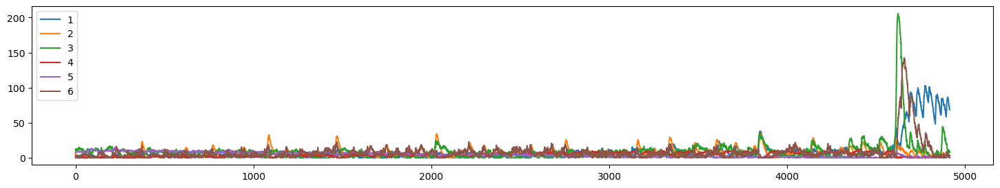

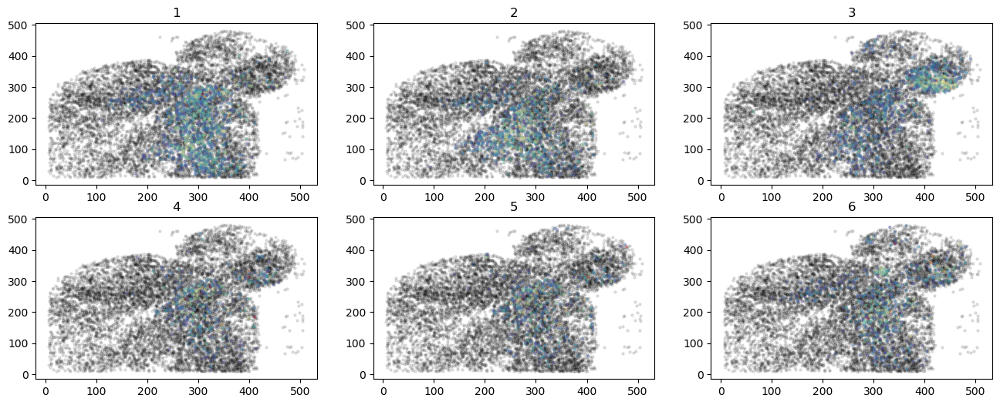

In [62]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 3, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

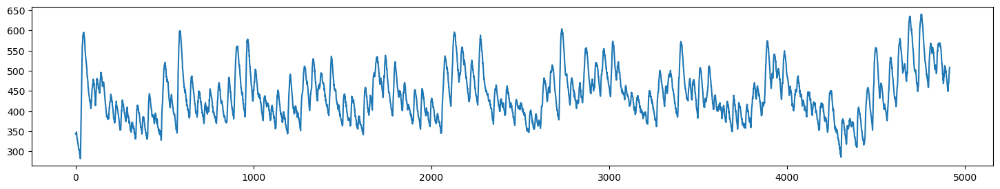

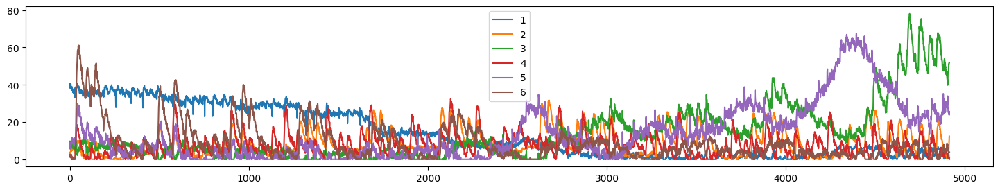

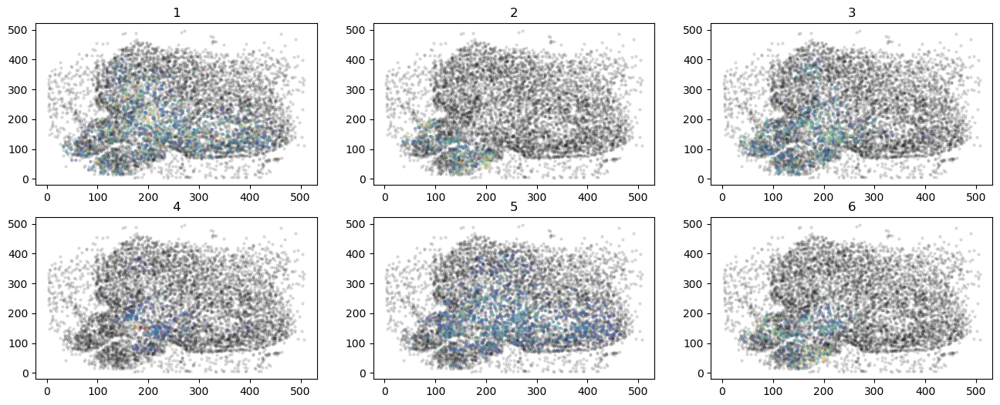

In [63]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 4, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

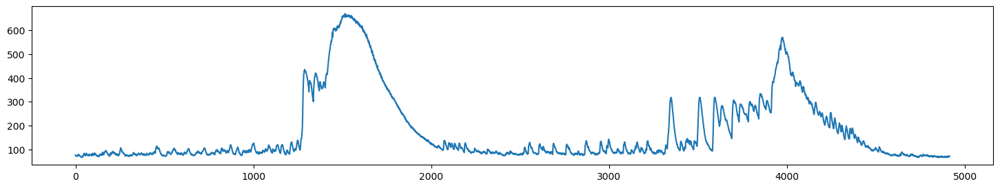

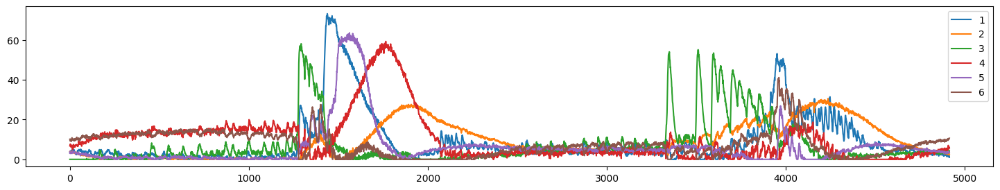

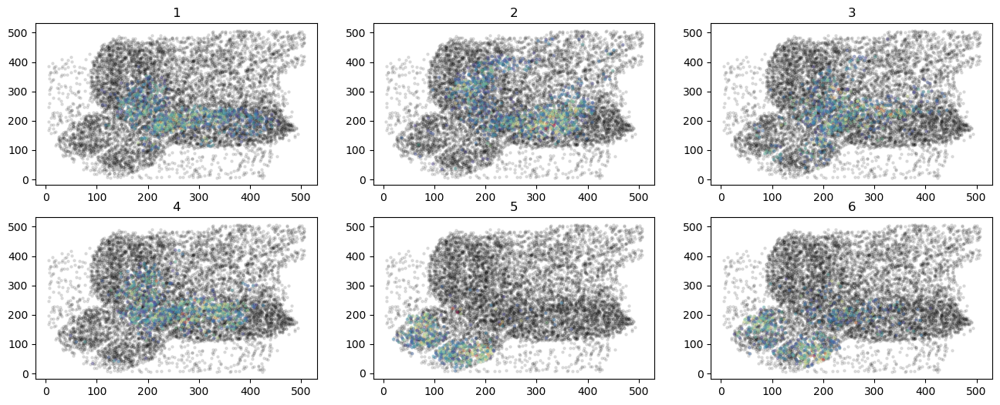

In [4]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 5, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

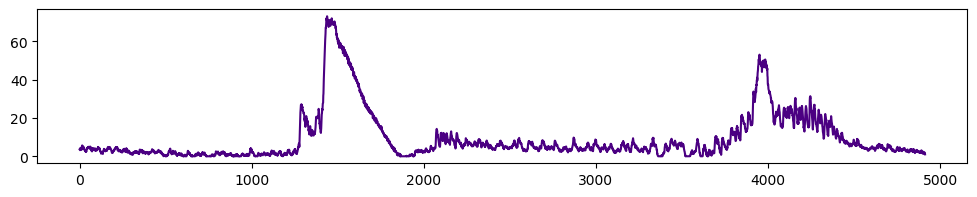

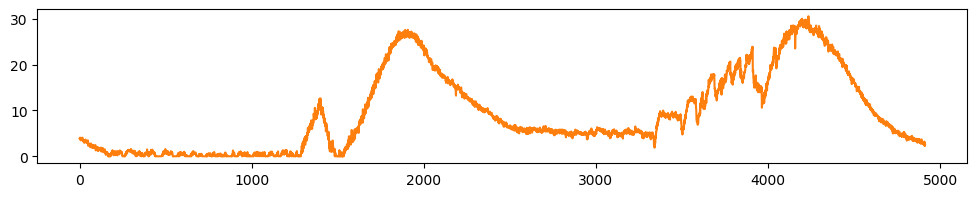

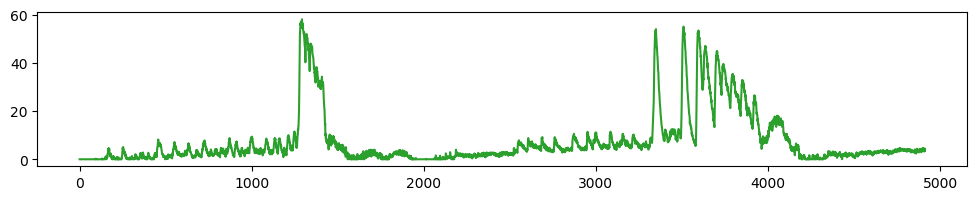

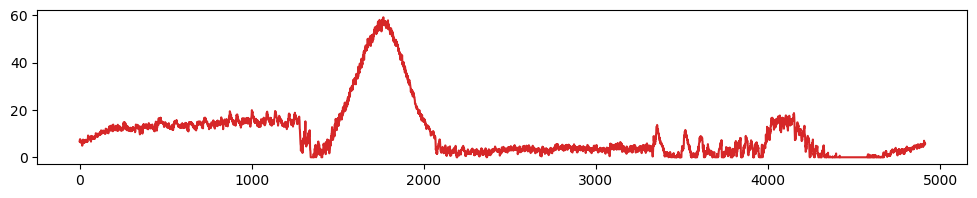

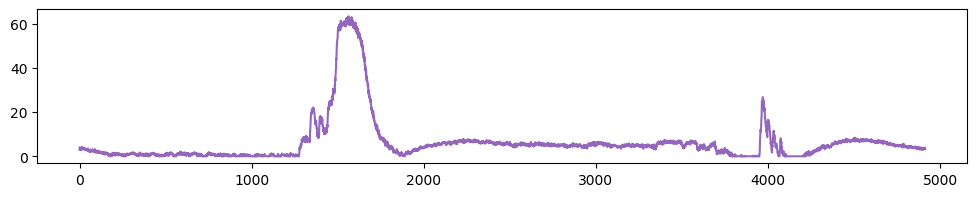

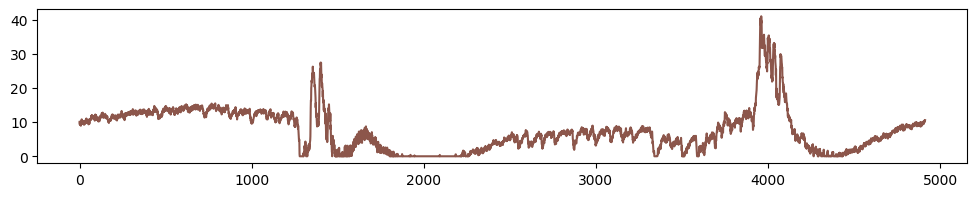

In [25]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 5, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])
colors = ['indigo', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', 'orangered', '#17becf', '#1f77b4']

for i in range(n_components-1):
    fig, ax = plt.subplots(figsize= (12,2))
    ax.plot(fit.components_[i+1], label = str(i + 1), c=colors[i])
    plt.savefig(Ffig + 'nnmf' + str(i) + '.svg', transparent = True)
    plt.show()



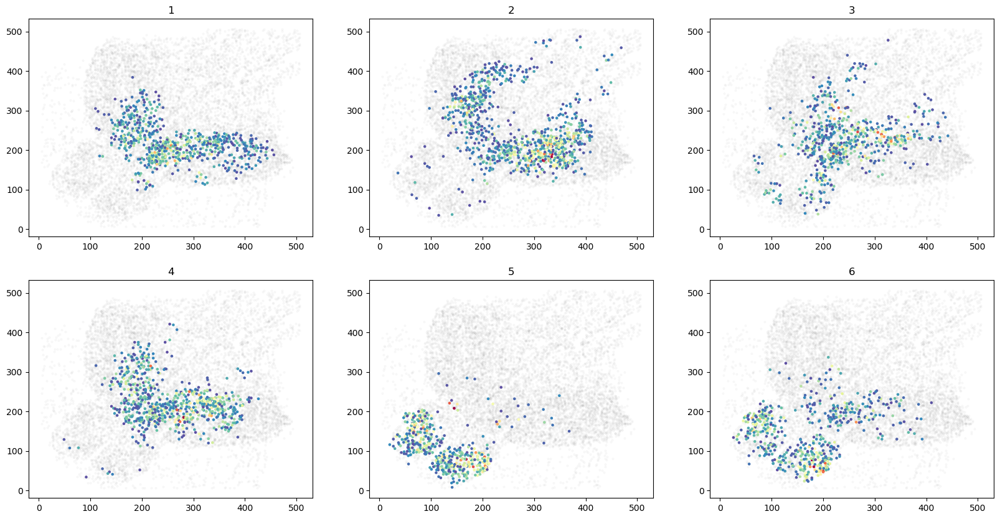

In [33]:
fig, axarr = plt.subplots(2,3, figsize= (20,10))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.02)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 1)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

In [ ]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 5, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

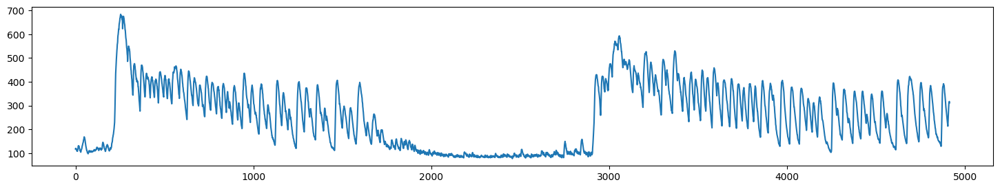

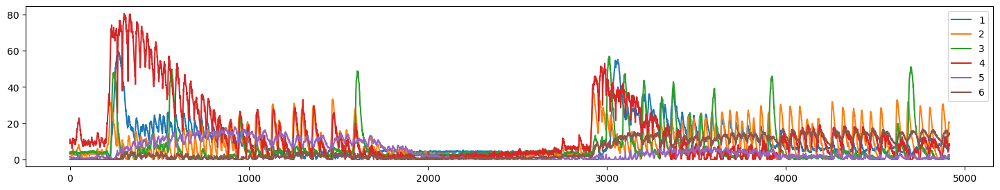

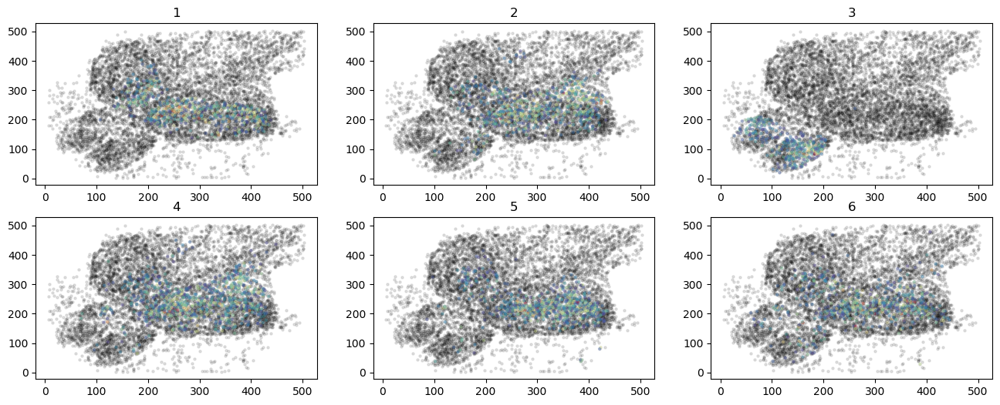

In [65]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 6, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

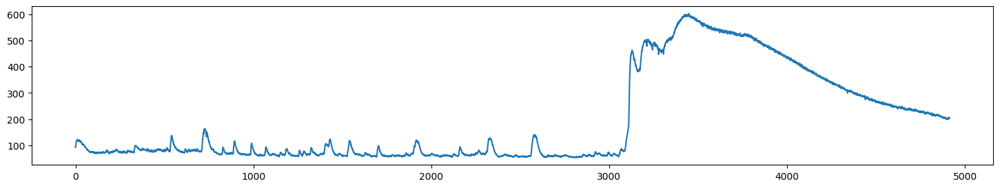

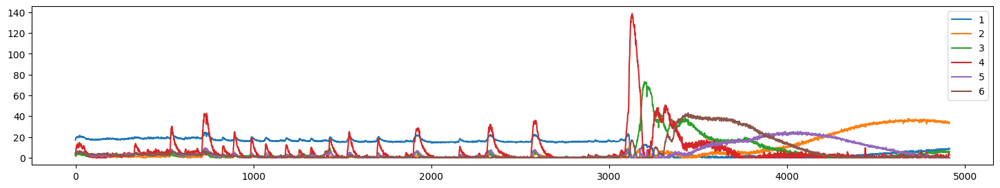

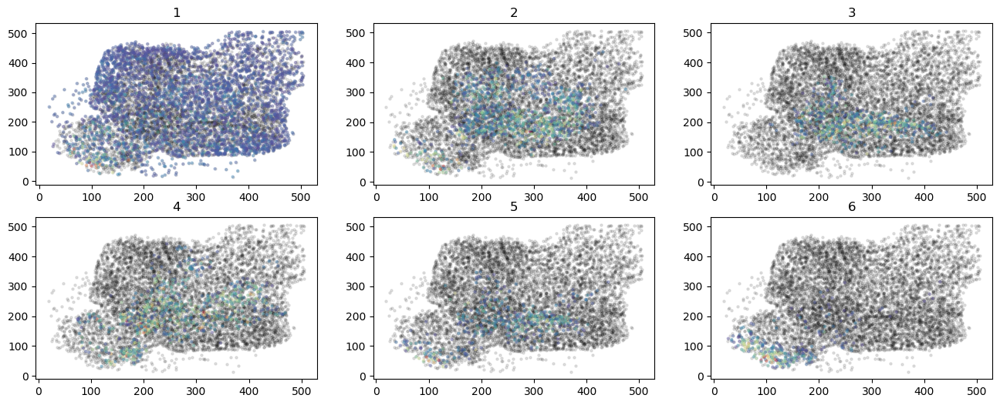

In [66]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 7, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

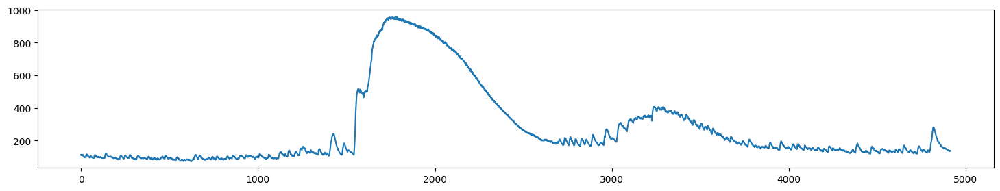

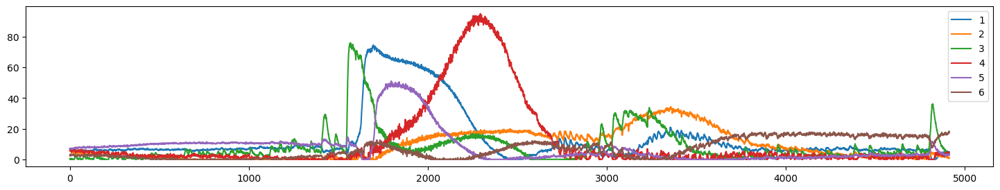

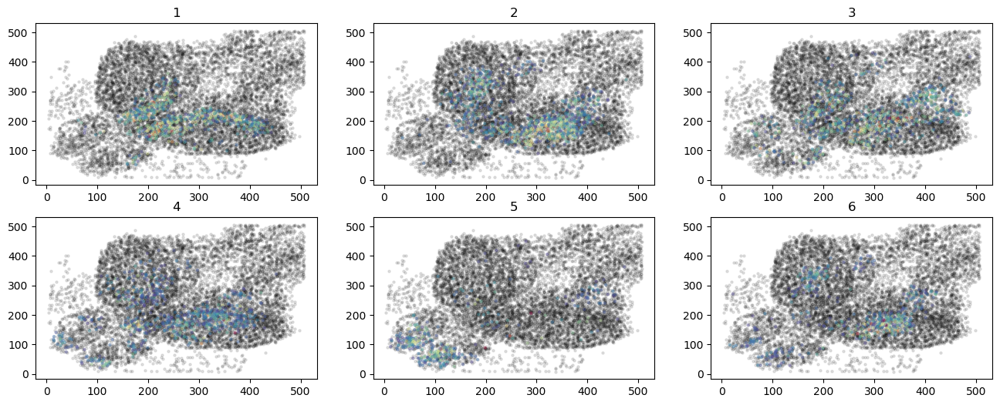

In [67]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 8, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

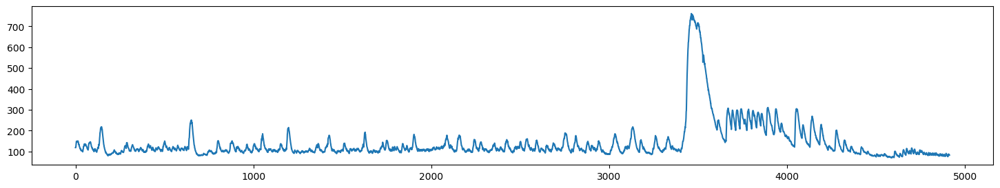

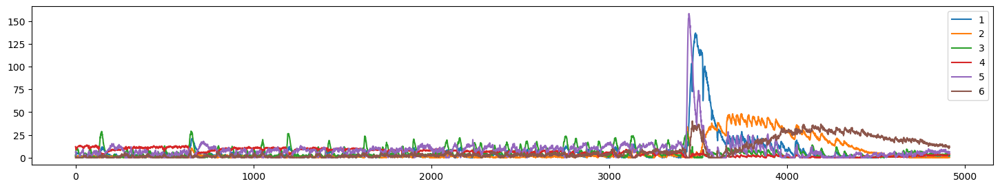

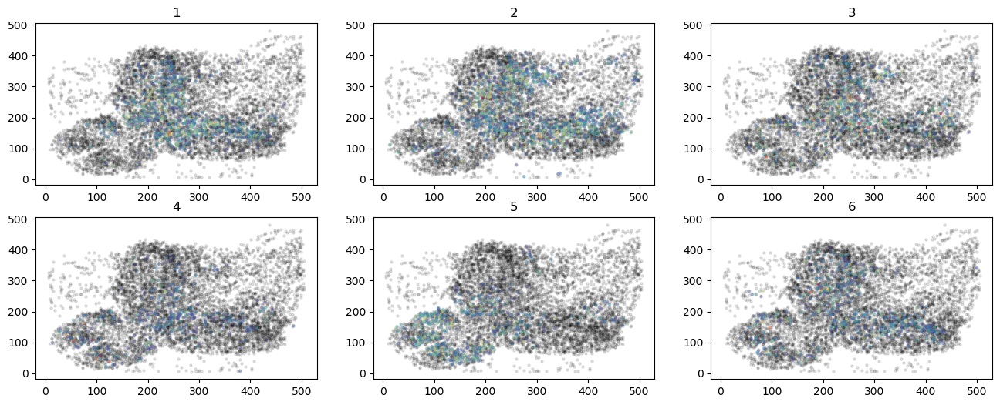

In [68]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 9, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()

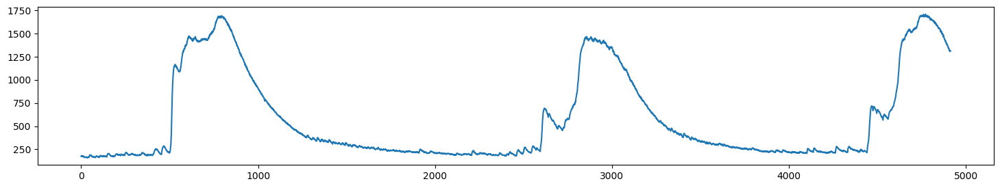

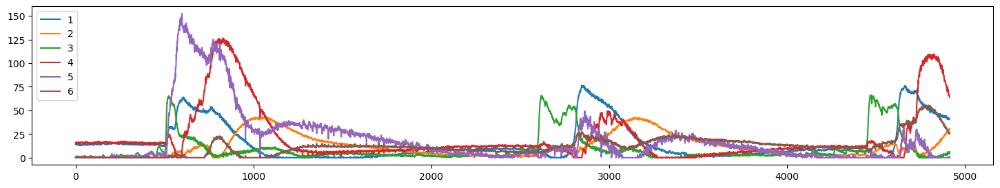

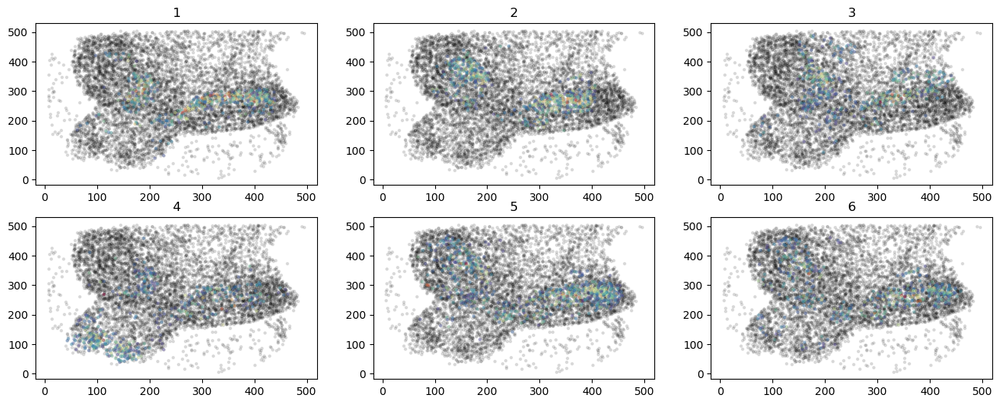

In [69]:
#matrix factorisation - time frames
#---------------------------------
from sklearn import decomposition
i, n_components, scale = 10, 7, 3
coordz = np.load(coordlist[i])
p20 = np.load(p20raw[i])

fig, ax = plt.subplots(figsize= (18,3))
mean = np.apply_along_axis(np.mean, 0, p20)
plt.plot(mean)

nmf = decomposition.NMF(n_components)
fit = nmf.fit(p20 - np.min(p20))
cells = nmf.fit_transform(p20 - np.min(p20))

fig, ax = plt.subplots(figsize= (18,3))
for i in range(n_components-1):
    plt.plot(fit.components_[i+1], label = str(i + 1))
    plt.legend()

fig, axarr = plt.subplots(2,3, figsize= (16,6))
count1,count2=0,0
for i in range(n_components-1):
    master = axarr[count1,count2].scatter(coordz[:,0], coordz[:,1], s=5, c = 'k', alpha = 0.1)
    dotplot = axarr[count1,count2].scatter(coordz[:,0][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], coordz[:,1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]], s=5, c = cells[:,i+1][np.where(cells[:,i+1] > scale*(np.std(cells[:,i+1])))[0]] , cmap = 'Spectral_r', alpha = 0.3)
    axarr[count1,count2].set_title(str(i + 1))
    count2+=1
    if i == 2:
        count1 +=1
        count2 = 0
plt.show()